In [1]:
import gym
import numpy as np
import itertools
import matplotlib.pyplot as plt
import random

In [2]:
class RBFDiscritizer:
    def __init__(self, num_rbf_per_state, state_bounds, num_states):
        self.num_rbf_per_state = num_rbf_per_state
        self.state_bounds = state_bounds
        self.num_states = num_states
        self.num_rbf = num_rbf_per_state * np.ones(self.num_states).astype(int)
        self.num_ind = np.prod(self.num_rbf)
        self.width = 1. / (self.num_rbf - 1.)
        self.rbf_sigma = self.width[0] / 2.
        self.rbf_den = 2 * self.rbf_sigma ** 2
        self.centres = self.build_centers()

    def build_centers(self):
        # Generate a meshgrid for the centers based on the number of RBFs per dimension
        ranges = [np.linspace(0, 1, num) for num in self.num_rbf]
        mesh = np.meshgrid(*ranges, indexing='ij')
        # Flatten the meshgrid and stack it to get the center coordinates
        center_coords = np.stack([axis.flatten() for axis in mesh], axis=-1)
        return center_coords

    def normalize_state(self, state):
        normalized = np.zeros(len(state))
        for i, (lower, upper) in enumerate(self.state_bounds):
            normalized[i] = (state[i] - lower) / (upper - lower)
        return normalized

    def encode(self, state):
        normalized_state = self.normalize_state(state)
        _phi = np.zeros(self.num_ind)
        for _k in range(self.num_ind):
            _phi[_k] = np.exp(-np.linalg.norm(normalized_state - self.centres[_k, :]) ** 2 / self.rbf_den)
        return _phi

In [15]:
class discretize_action:
    def __init__(self, env) -> None:
        self.env = env
        self.action_space = self.env.action_space

    def discretize_action_space(self, steps_per_dimension):
        """
        Discretizes the action space.

        Parameters:
        - low: The lower bound of the action space.
        - high: The higher bound of the action space.
        - steps_per_dimension: Number of discrete steps per dimension.

        Returns:
        - A list of discretized actions.
        """
        low = self.action_space.low
        high = self.action_space.high

        # Generate a range of values for each dimension
        ranges = [np.linspace(low[i], high[i], steps_per_dimension) for i in range(len(low))]

        # Create a meshgrid of all possible combinations
        mesh = np.meshgrid(*ranges)

        # Reshape the meshgrid to create a list of actions
        self.actions = np.vstack([m.flatten() for m in mesh]).T

        return self.actions

    def allocate_action(self, action):
        distances = np.linalg.norm(self.actions - action, axis=1)
        nearest_index = np.argmin(distances)
        return self.actions[nearest_index]


class Expected_SARSA_Continuous_Action:
    def __init__(self, env, gamma, num_tiles):
        self.state_num = env.observation_space.shape[0]
        discrete_actions = discretize_action(env)
        action_list = discrete_actions.discretize_action_space(steps_per_dimension)
        self.action_num = len(action_list)
        self.w = np.random.uniform(-0.001, 0.001, (num_tiles, self.action_num))
        self.gamma = gamma

    #define the greedy policy
    def policy(self, states, epsilon):
        if random.uniform(0, 1) < epsilon:
            return np.random.randint(self.action_num)
        else:
            return states.argmax()

    def apply_weight(self, state): #dot product for linear approximation function with weights vector
        return np.dot(state, self.w)

    def update(self, current, target, reward, state, action, alpha, done):
        error = reward + self.gamma * target* (not done) - current
        #print(error)
        self.w[:, action] += alpha * error * state


def Expected_SARSA_Continuous(env, tile, alpha, epsilon,  num_tiles, trials, gamma = 0.99):
    trial_reward = []
    for j in range(trials):
        Expected_SAR = Expected_SARSA_Continuous_Action(env, gamma, num_tiles)
        tiling = tile
        #print(d_state)
        initial_epsilon = epsilon
        epsilon_c = initial_epsilon

        rewards = []
        for i in range(episodes):
            s = env.reset()
            reward_ep = 0
            done = False
            state_encoding = tiling.encode(s)
            #print(state_encoding)
            state_value = Expected_SAR.apply_weight(state_encoding)
            step = 0

            while not done:
                a = Expected_SAR.policy(state_value, epsilon_c)
                v_i = state_value[a]
                #print(action_list[a])
                s, reward, done,  _ = env.step(action_list[a])
                next_state = tiling.encode(s)
                v_next = epsilon_c * np.mean(Expected_SAR.apply_weight(next_state)) + (1 - epsilon_c) * np.max(Expected_SAR.apply_weight(next_state))
                Expected_SAR.update(v_i, v_next, reward, state_encoding, a, alpha, done)
                state_encoding = next_state
                state_value = Expected_SAR.apply_weight(state_encoding)
                reward_ep += reward
                step += 1
            if epsilon_c > 0.1:
                epsilon_c -= 0.0004
            rewards.append(reward_ep)
            print(f'episode:{i}, reward: {reward_ep}, step: {step}, epsilon: {epsilon_c}')
        trial_reward.append(rewards)

    return trial_reward

episode:0, reward: -45.675000000000026, step: 1000, epsilon: 0.8996000000000001
episode:1, reward: -44.599999999999994, step: 1000, epsilon: 0.8992000000000001
episode:2, reward: -47.249999999999986, step: 1000, epsilon: 0.8988000000000002
episode:3, reward: -44.57499999999999, step: 1000, epsilon: 0.8984000000000002
episode:4, reward: -44.17499999999999, step: 1000, epsilon: 0.8980000000000002
episode:5, reward: -45.399999999999956, step: 1000, epsilon: 0.8976000000000003
episode:6, reward: -43.15000000000001, step: 1000, epsilon: 0.8972000000000003
episode:7, reward: -46.4, step: 1000, epsilon: 0.8968000000000004
episode:8, reward: -43.224999999999945, step: 1000, epsilon: 0.8964000000000004
episode:9, reward: -46.02499999999996, step: 1000, epsilon: 0.8960000000000005
episode:10, reward: -45.97499999999996, step: 1000, epsilon: 0.8956000000000005
episode:11, reward: -43.024999999999935, step: 1000, epsilon: 0.8952000000000006
episode:12, reward: -46.67499999999996, step: 1000, epsil

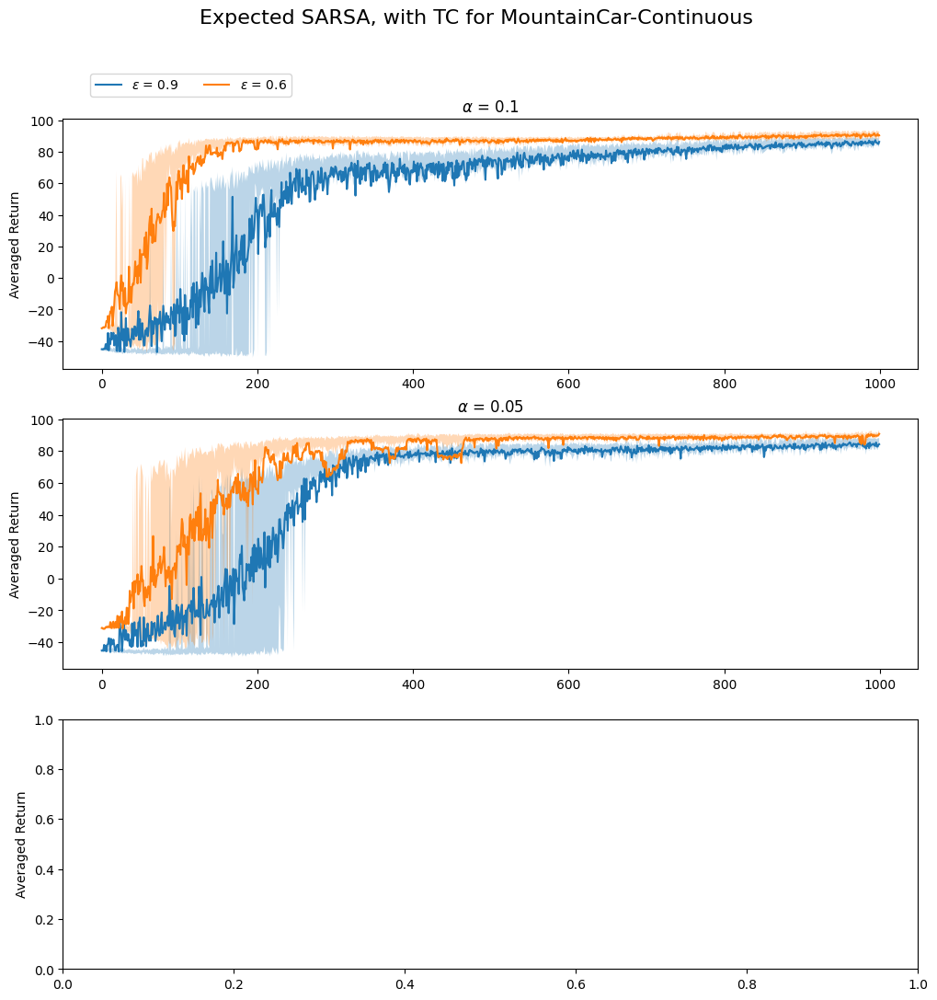

In [27]:
env = gym.make("MountainCarContinuous-v0")
env._max_episode_steps = 1000
obs = env.reset()

#define the parameters
epsilon = [0.9, 0.6]
alpha = [1e-1, 0.05] #, 5e-4, 1e-4]
steps_per_dimension = 5
discrete_actions = discretize_action(env)
action_list = discrete_actions.discretize_action_space(steps_per_dimension)
#print(action_list)
trials = 30
gamma = 0.7
episodes = 1000

num_states = 2
num_rbf_per_state=4
state_bounds = [(-1.2, 0.6), (-0.07, 0.07)]  # Bounds 

discretizer = RBFDiscritizer(num_rbf_per_state=num_rbf_per_state, state_bounds=state_bounds, num_states=num_states)

num_tiles = discretizer.num_ind

MCC_epsilon_return_SARSA = []
for j in range(len(alpha)):
    learning_return_SARSA = []
    for i in range(len(epsilon)):
        avg_return = Expected_SARSA_Continuous(env, discretizer, alpha[j], epsilon[i],num_tiles, trials)
        learning_return_SARSA.append(avg_return)
    MCC_epsilon_return_SARSA.append(learning_return_SARSA)

fig, axs = plt.subplots(nrows=3, ncols=1, figsize=(12, 12))

#print(learning_return[0])

plt.rcParams["figure.figsize"]=10,5

for i, learning in enumerate(MCC_epsilon_return_SARSA):

    for j, alpha_data in enumerate(learning):
        ar_1_mean = np.mean(alpha_data, axis = 0)
        par_1_75, par_1_25 = np.percentile(alpha_data, [75, 25], axis = 0)
        if i == 0:
            axs[i].plot(range(episodes), ar_1_mean, label = f'${{\\epsilon}}$ = {epsilon[j]}')
        else:
            axs[i].plot(range(episodes), ar_1_mean)
        axs[i].set_title(f'${{\\alpha}}$ = {alpha[i]}')
        axs[i].fill_between(range(episodes), par_1_25, par_1_75, alpha=0.3)

plt.setp(axs, ylabel = 'Averaged Return')
fig.suptitle('Expected SARSA, with TC for MountainCar-Continuous', fontsize = 16)

fig.legend(bbox_to_anchor=(0.15, 0.9, 1., .102), loc='lower left',
           ncol=3, borderaxespad=0.)


import os
import pickle

pkl_path = './Expected_SARSA_RBF/'
os.makedirs(pkl_path, exist_ok=True)

dataStore = {}
for i, learning in enumerate(MCC_epsilon_return_SARSA):
    dataStore[alpha[i]] = {}
    for j, alpha_data in enumerate(learning):
        dataStore[alpha[i]][epsilon[j]] = alpha_data

with open(pkl_path + 'continous_mc' + '.pkl', 'wb') as fp:
    pickle.dump(dataStore, fp)
    print('dictionary saved successfully to file')